# Dask Testing

### Basic Functionality



This notebook introduces the following concepts:
 - The Datacube module
 - Loading Data
 - Visualising Data
 - Filtering out cloud and occluded land pixels
 - Visualising nDVI trough time.

In [1]:
import datacube # Load the datacube library
import datetime
import numpy as np
import json
import matplotlib.pyplot as plt
from utils.utils import (
    lat_lon_to_epsg,
    three_band_image,
    load_config_extents,
    transform_to_wgs)

In [2]:
# Load the extent parameters used to index data cube in the box data.
extents, bbox = load_config_extents('/opt/odc/data/configIndex.txt')

lon_min,lon_max,lat_min,lat_max = extents
# Get the EPSG of a WGS UTM coordinate reference system that is appropriate for our data
EPSG = lat_lon_to_epsg(lat_max,lon_min)

In [3]:
#Creating an instance of the datacube.
dc = datacube.Datacube(app='dc-visualize')

In the sample below we use the datacube.load command to load the RGB and Quality Assurance(QA) bands from the AWS Landsat archive. Landsat 8 has a return period of 16 days capturing over 24 snapshots a year so care should be taken when requesting a datacube as large geographical or time extents can quickly over fill memory and generate huge lag. 

For our first visualisation we'll load a single time slice of the full geographical extent indexed and then proceed to select a smaller zone to explore through time.

It should be noted that images on AWS are referenced to WGS 84 so the extent bounds that are entered into the datacube.load() must match the coordinate system in which they're being stored. 

The datacube.load() command also reprojects into a coordinate system in the below datacube load we automatically generate an EPSG code from the lat/long of the provided extent. 

If you'd like to visualize other bands add any of the below measurements to the `datacube.load(measurements= ...`:

Landsat 8 measurement options are:

             ('1', 'coastal_aerosol')
             ('2', 'blue')
             ('3', 'green')
             ('4', 'red')
             ('5', 'nir')
             ('6', 'swir1')
             ('7', 'swir2')
             ('8', 'panchromatic')
             ('9', 'cirrus')
             ('10', 'lwir1')
             ('11', 'lwir2')
             ('QUALITY', 'quality')]


In [4]:
%%time

date_range = (
    datetime.datetime(2017, 3, 12),
    datetime.datetime(2017, 3, 14)) 
ds = dc.load(
    product='ls8_level1_usgs',
    x=(lon_min, lon_max),
    y=(lat_min, lat_max), 
    output_crs='epsg:' + EPSG,
    resolution=(-30, 30),
    time = date_range, 
    measurements = ('red','nir'),
    dask_chunks = {'x': 1000, 'y': 1000, 'time': 1}
)

CPU times: user 40 ms, sys: 0 ns, total: 40 ms
Wall time: 44.3 ms


/usr/local/lib/python3.6/dist-packages/xarray/core/variable.py:134: FutureWarning: Converting timezone-aware DatetimeArray to timezone-naive ndarray with 'datetime64[ns]' dtype. In the future, this will return an ndarray with 'object' dtype where each element is a 'pandas.Timestamp' with the correct 'tz'.
	To accept the future behavior, pass 'dtype=object'.
	To keep the old behavior, pass 'dtype="datetime64[ns]"'.
  return np.asarray(pd.Series(values.ravel())).reshape(values.shape)


*Please wait patiently for the above to finish (it's finished when the &ast; is gone).*

The `datacube.load()` command returns an [xarray](https://xarray.pydata.org/en/stable/). The key to building effective ODC algorithms is to master the use of the xarray. Please click on the documention to find out more otherwise a number of examples are provided below.

The xarray for landsat contains the dimensions of X, Y and Time - for each combination of these dimensions data listed as "Data Variables" can be retrieved. 

In [5]:
import dask
@dask.delayed
def do_work(ds):
    return (ds.nir - ds.red) / (ds.nir + ds.red)


In [6]:
import numpy as np
from dask.distributed import Client
client = Client('dask-scheduler:8786')
test = do_work(ds)

In [7]:
%%time
new_ds = test.compute()

CPU times: user 40 ms, sys: 10 ms, total: 50 ms
Wall time: 12.3 s


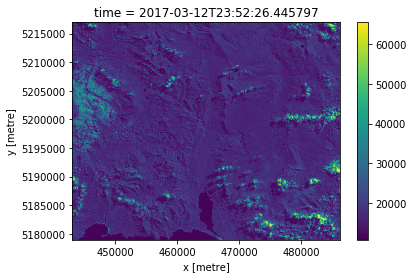

In [8]:
new_ds.plot()

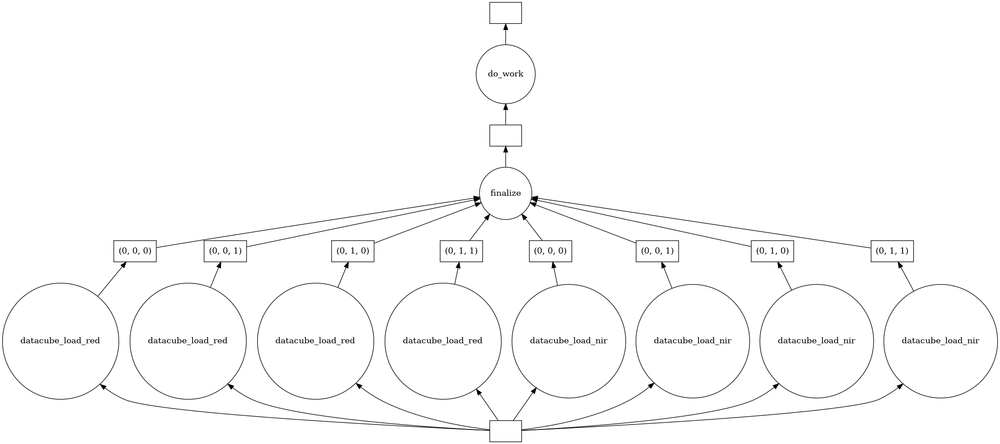

In [9]:
test.visualize()

Next we'll explore [Landsat 8 quality band](https://landsat.usgs.gov/collectionqualityband), each pixel in the QA band contains unsigned integers that represent bit-packed combinations of surface, atmospheric, and sensor conditions that can affect the overall usefulness of a given pixel.

Used effectively, QA bits improve the integrity of science investigations by indicating which pixels might be affected by instrument artifacts or subject to cloud contamination. The ODC has in built methods that transform the metadata of a specific product to a libary of masking templates. For example, you are able to build a cloud mask directly from the ODC library.

In [10]:
from datacube.storage import masking  # Import masking capabilities
print (masking.describe_variable_flags(ds)) #D escribe the masks available



                            bits  \
cirrus_confidence       [11, 12]   
cloud                        [4]   
cloud_confidence          [5, 6]   
cloud_shadow_conf         [7, 8]   
designated_fill              [0]   
radiometric_saturation    [2, 3]   
snow_ice_conf            [9, 10]   
terrain_occlusion            [1]   

                                                                   values  \
cirrus_confidence       {'0': 'Not Determined', '1': 'Low', '2': 'Medi...   
cloud                                             {'0': False, '1': True}   
cloud_confidence        {'0': 'Not Determined', '1': 'Low', '2': 'Medi...   
cloud_shadow_conf       {'0': 'Not Determined', '1': 'Low', '2': 'Medi...   
designated_fill                                   {'0': False, '1': True}   
radiometric_saturation  {'0': 'none', '1': '1-2', '2': '3-4', '3': '<=5'}   
snow_ice_conf           {'0': 'Not Determined', '1': 'Low', '2': 'Medi...   
terrain_occlusion                                 {'0': Fal

In [11]:
# Create mask around all pixels deemed good according to parameters around cloud cover and saturation.
clean_pixel_mask = masking.make_mask(
    ds.quality,
    cloud=False,
    radiometric_saturation='none',
    terrain_occlusion = False)

print(clean_pixel_mask)

masked_cloud = ds.where(clean_pixel_mask)

print(masked_cloud)

<xarray.DataArray 'quality' (time: 1, y: 1267, x: 1439)>
array([[[False, False, ...,  True,  True],
        [False, False, ...,  True,  True],
        ...,
        [ True,  True, ...,  True,  True],
        [ True,  True, ...,  True,  True]]])
Coordinates:
  * time     (time) datetime64[ns] 2017-03-12T23:52:26.445797
  * y        (y) float64 5.217e+06 5.217e+06 5.217e+06 5.217e+06 5.217e+06 ...
  * x        (x) float64 4.431e+05 4.431e+05 4.432e+05 4.432e+05 4.432e+05 ...
<xarray.Dataset>
Dimensions:  (time: 1, x: 1439, y: 1267)
Coordinates:
  * time     (time) datetime64[ns] 2017-03-12T23:52:26.445797
  * y        (y) float64 5.217e+06 5.217e+06 5.217e+06 5.217e+06 5.217e+06 ...
  * x        (x) float64 4.431e+05 4.431e+05 4.432e+05 4.432e+05 4.432e+05 ...
Data variables:
    red      (time, y, x) float64 nan nan nan nan nan nan nan nan nan nan ...
    green    (time, y, x) float64 nan nan nan nan nan nan nan nan nan nan ...
    blue     (time, y, x) float64 nan nan nan nan nan nan na

Next we'll display the RGB bands that we have extracted from our cube for the first time slice (time = 0) in order to visualise a comprehendible RGB image we apply a histogram equalisation on each band before displaying. We'll also create visualisation of the pixels that are occluding land areas.

<IPython.core.display.Javascript object>


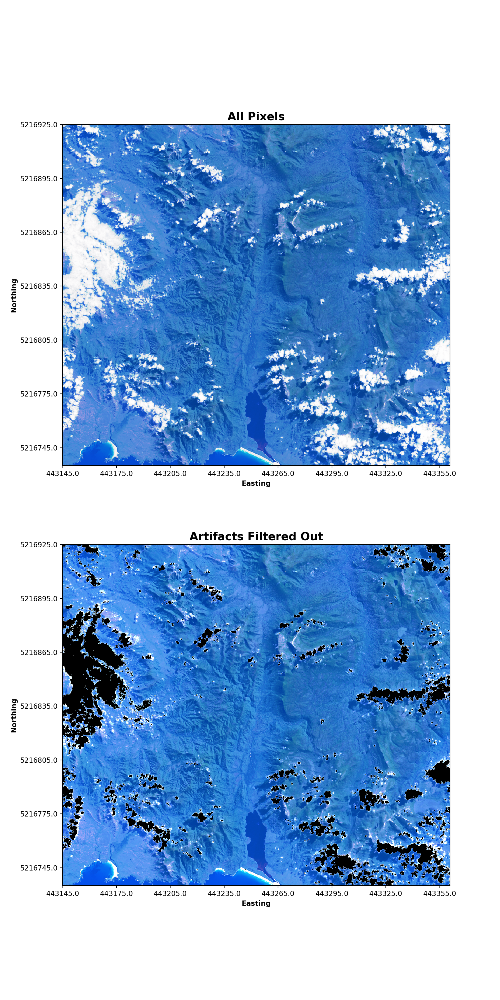

In [13]:
%matplotlib notebook

def callback(event):
    global x, y
    x, y = int(event.xdata + 0.5), int(event.ydata + 0.5)


time = 0
img_toshowNoMask = three_band_image(masked_cloud,bands = ['red', 'green', 'blue'], time = time)
img_toshow = three_band_image(ds,bands = ['red', 'green', 'blue'], time = time)
#fig, (ax1, ax2) = plt.subplots(2, 1)
fig = plt.figure(1, [10,20])
fig.canvas.mpl_connect('button_press_event', callback)

plt.subplot(211)
ax = plt.gca()
ax.set_title("All Pixels", fontweight = 'bold', fontsize = 16)
ax.set_xticklabels(ds.x.values)
ax.set_yticklabels(ds.y.values)
ax.set_xlabel('Easting', fontweight = 'bold')
ax.set_ylabel('Northing', fontweight = 'bold')

plt.imshow(img_toshow)

plt.subplot(212)
ax = plt.gca()
ax.set_title("Artifacts Filtered Out", fontweight = 'bold', fontsize = 16)
ax.set_xticklabels(ds.x.values)
ax.set_yticklabels(ds.y.values)
ax.set_xlabel('Easting', fontweight = 'bold')
ax.set_ylabel('Northing', fontweight = 'bold')
plt.imshow(img_toshowNoMask)



Next we'll select a single pixel from any of the above images and drill through the time dimension to calculate the change in nDVI.

Before running the below cell click on a location in the above visualisations to select an area to explore through time with a 100x100 lens.

In [15]:
pixelDrillExtent = []
for i in [[x , y], [x + 100, y + 100]]:
    xI, yI = i
    getLong = ds.isel(x=[xI], y=[yI]).isel(time=0).x.values
    getLat = ds.isel(x=[xI], y=[yI]).isel(time=0).y.values
    
    pixelDrillExtent.append(transform_to_wgs(getLong, getLat,int(EPSG)))
print (pixelDrillExtent)

[[146.4847941936686, -43.378393303943504], [146.52161453662038, -43.40556660824053]]


By expanding out the time extent and limiting the x,y extent in the datacube.load() we are able to retrieve cross section through time.


In [17]:
%%time
date_range = (datetime.datetime(2017,3,12), datetime.datetime(2018,3,14))
ds1 = dc.load(
    product='ls8_level1_usgs',
    x=(pixelDrillExtent[0][0], pixelDrillExtent[1][0]),
    y=(pixelDrillExtent[0][1], pixelDrillExtent[1][1]), 
    output_crs='epsg:28355',
    resolution=(-30,30),
    time=date_range,
    measurements=('red','nir','quality'),
    use_threads=True)



CPU times: user 13.1 s, sys: 17.8 s, total: 30.9 s
Wall time: 5min 25s


In [18]:
print (ds1)

<xarray.Dataset>
Dimensions:  (time: 45, x: 101, y: 102)
Coordinates:
  * time     (time) datetime64[ns] 2017-03-12T23:52:26.445797 ...
  * y        (y) float64 5.197e+06 5.197e+06 5.197e+06 5.197e+06 5.197e+06 ...
  * x        (x) float64 4.583e+05 4.583e+05 4.583e+05 4.584e+05 4.584e+05 ...
Data variables:
    red      (time, y, x) int16 6026 5967 5970 5989 6040 6102 6099 6024 5969 ...
    nir      (time, y, x) int16 12176 10873 10368 10792 11421 12108 12716 ...
    quality  (time, y, x) int16 2720 2720 2720 2720 2720 2720 2720 2720 2720 ...
Attributes:
    crs:      epsg:28355


We use band math to derive an nDVI and mask out occluded measurements.

<IPython.core.display.Javascript object>


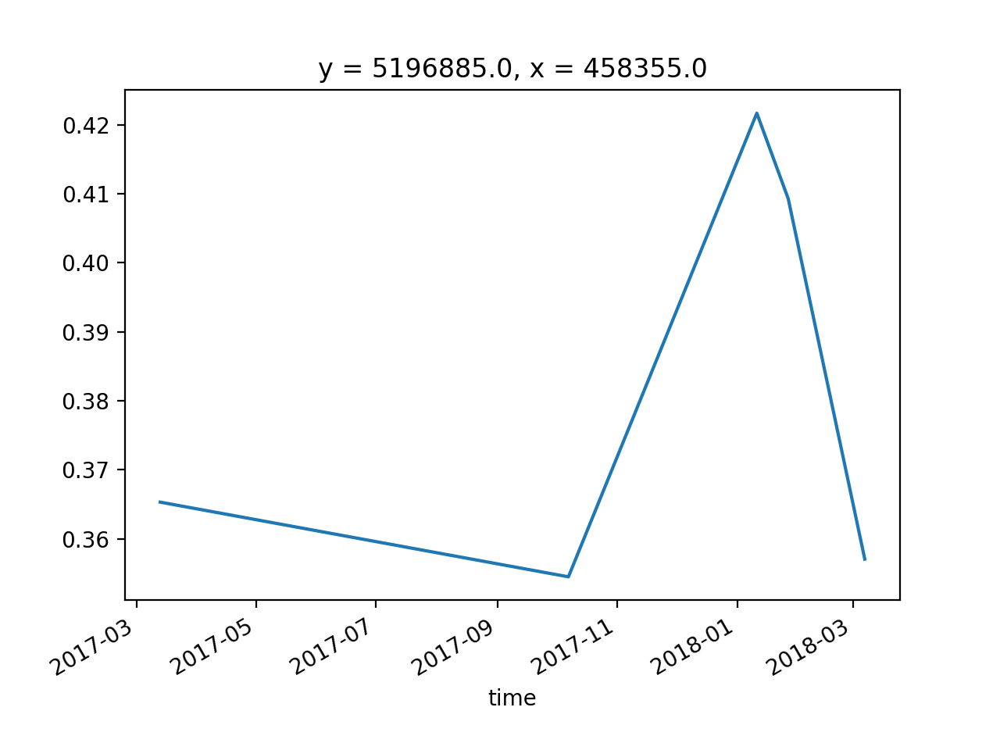

In [19]:
%matplotlib notebook

red = ds1.red.where(ds1.red != ds1.red.attrs['nodata'])
nir = ds1.nir.where(ds1.nir != ds1.nir.attrs['nodata'])

cloud_free = masking.make_mask(ds1.quality,cloud=False, radiometric_saturation = 'none', terrain_occlusion = False)

ndvi = ((nir - red) / (nir + red)).where(cloud_free).dropna('time')
ndvi.isel(x=[3], y=[6]).plot() #Plots the change in nDVI over the time extent using the array index.
#ndvi.isel(x =465105, y=5194065).plot() #Plots the change in nDVI over the time extent using the X and Y coordinate.




Plot out a crossection accross the y axis of an x coordinate over a time extent.

<IPython.core.display.Javascript object>


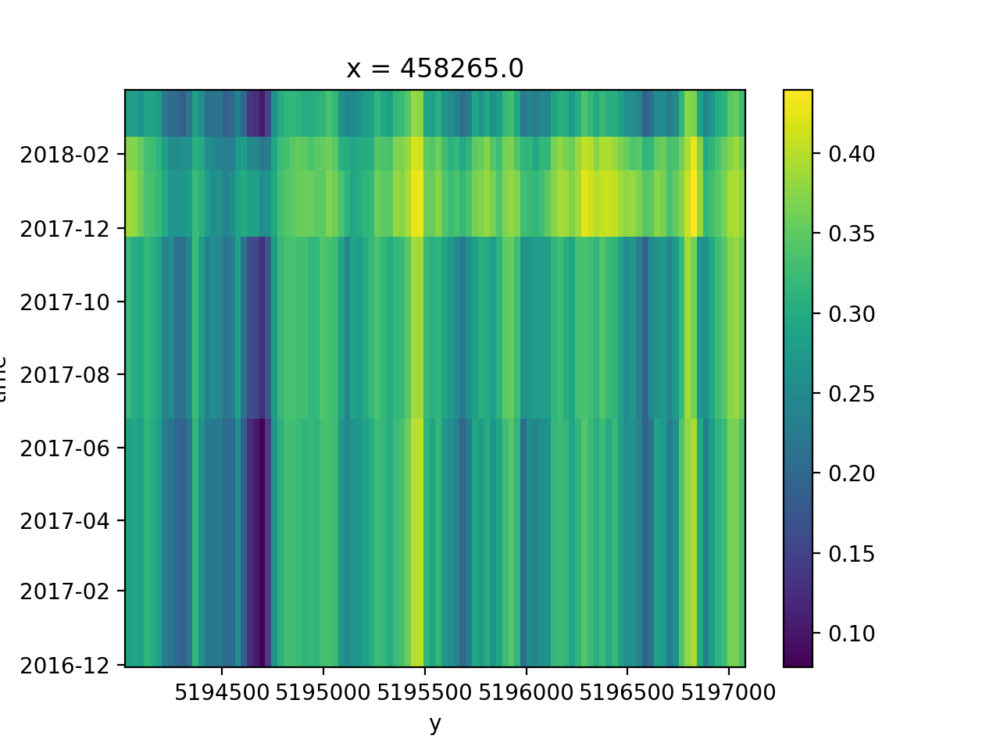

In [20]:
%matplotlib notebook
ndvi.isel(x =[0]).plot()
